# Volume 3: Recurrent Neural Networks    
    Daniel Perkins
    MATH 405
    12/30/24

In [ ]:
!pip install --upgrade music21
from music21 import converter, instrument, note, chord, stream
import glob
import os
import gzip
import tarfile
from torchvision import datasets
import numpy as np
import torch
import torch.nn as nn
import torch.optim
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
from tqdm import tqdm

assert torch.cuda.is_available()

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [ ]:
# Import Drive for easier saving
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
def download_data(filepath):
    if not os.path.exists(os.path.join(filepath, 'mozart_sonatas.tar.gz')):
        datasets.utils.download_url('https://github.com/Foundations-of-Applied-Mathematics/Data/raw/master/RNN/mozart_sonatas.tar.gz', filepath, 'mozart_sonatas.tar.gz', None)

    print('Extracting {}'.format('mozart_sonatas.tar.gz'))
    gzip_path = os.path.join(filepath, 'mozart_sonatas.tar.gz')
    with open(gzip_path.replace('.gz', ''), 'wb') as out_f, gzip.GzipFile(gzip_path) as zip_f:
        out_f.write(zip_f.read())

    print('Untarring {}'.format('mozart_sonatas.tar'))
    tar_path = os.path.join(filepath, 'mozart_sonatas.tar')
    z = tarfile.TarFile(tar_path)
    z.extractall(tar_path.replace('.tar', ''))


# Problem 1 #

Download the data.
Write a function that accepts the path to the .mid files, parses the files, and returns a list of the 114215 Notes and Chords as strings.
There are many element types in MIDI files, so be sure to only look for Notes and Chords.
For the Chords, join the pitches of the Notes in the Chords with a . as in (D3.D2).

Print the length of your list and the number of unique Notes and Chords.


In [ ]:
# Download the data
data_dir = "drive/MyDrive/Colab Notebooks/MATH 405/RNN"
download_data(data_dir)

Extracting mozart_sonatas.tar.gz
Untarring mozart_sonatas.tar


In [ ]:
def parse_data(file_path):
  notes_and_chords = []
  files = os.listdir(file_path)  # Get all the .mid files

  for file in files:
    abs_path = file_path + file  # Get absolute path

    midi = converter.parse(abs_path)   # Extract data
    notes_to_parse = instrument.partitionByInstrument(midi).parts.stream().recurse()

    # Store notes and chords into the list
    for element in notes_to_parse:
      if isinstance(element, note.Note):
        notes_and_chords.append(str(element.pitch))
      if isinstance(element, chord.Chord):
        notes_and_chords.append('.'.join(str(n) for n in element.pitches))

  return notes_and_chords

In [ ]:
file_path = data_dir + "/mozart_sonatas/mozart_sonatas/"
notes_and_chords = parse_data(file_path)

print("Length of list:", len(notes_and_chords))
print("Number of unique Notes and Chords:", len(set(notes_and_chords)))

Length of list: 114215
Number of unique Notes and Chords: 1147


# Problem 2 #

Using the list returned in Problem 1, create the training, validation, and testing DataLoaders.
Make sure to do all of the following steps:


1) Convert the pitches to integers.

2) Split the data into Long tensors of length 10.

3) Create the labels.

4) Randomly split the data into training, validation, and test sets using an 70/15/15 split (use torch.utils.data.random(data,lengths) where lengths=[0.7, 0.15, 0.15]).

5) Create the DataLoaders for these sets of data, using batch_size=128 for the training data and batch_size=32 for the validation and test data; also, set shuffle=True for the training data and False for the validation and test data (this is common practice in Deep Learning).


Print the length of each DataLoader (they should be 624, 536, and 536, respectively).

In [ ]:
set_of_notes_chords = list(set(notes_and_chords))  # Get list of unique notes/chords

# Convert pitches to integers
data = torch.zeros(len(notes_and_chords))
for i, the_note in enumerate(notes_and_chords):
  data[i] = set_of_notes_chords.index(the_note)
all_data = data.to(torch.long)   # Convert from float to long

# Split data into long tensors of length 10 and create the labels
length = 10
data = [[all_data[i:i+length], all_data[i+length].item()] for i in range(len(all_data) - length)]

# Split data into training, validation, and test set
train_data, val_data, test_data = torch.utils.data.random_split(data, [0.7, 0.15, 0.15])

# Get dataloaders
train_loader = DataLoader(train_data, batch_size=128, shuffle=True, drop_last=True)
val_loader = DataLoader(val_data, batch_size=32, shuffle=False)
test_loader = DataLoader(test_data, batch_size=32, shuffle=False)

# Print out the lengths
print("Length of train_loader:", len(train_loader))
print("Length of val_loader:", len(val_loader))
print("Length of test_loader:", len(test_loader))

Length of train_loader: 624
Length of val_loader: 536
Length of test_loader: 536


# Problem 3 #

Create an LSTM network class.
Have a hidden layer size of 256, and include at least $3$ LSTM layers.
Also have at least $2$ Linear layers.
The last LSTM layer and each of the Linear layers should be followed by a BatchNorm1d layer except for the last layer, for a total of at least $2$ total BatchNorm layers.

Initialize the model.
Define the loss as CrossEntropyLoss, and define the optimizer as RMSprop.

Train the model for 30 epochs.
Make sure to reinitialize the hidden states (h0, h1) for each training batch.
After taking a backwards step during training, scale the gradients using
nn.utils.clip_grad_norm_(model.parameters(), 5).
This will ensure that the gradients are reasonably sized so that the model can learn.

At the end of every epoch, calculate the validation accuracy and mean loss on the validation data.
Remember to change the model to eval() mode when running the validation data and then train() when running on the training data.
The hidden states (h0, h1) will also need to be reinitialized for each validation batch.

Once the training is complete, plot the training and validation losses versus epochs on the same plot.
Also, plot the validation accuracy versus epochs.
Then, print the final test accuracy by running the finished model on the test data.

In [ ]:
class RNN(nn.Module):
    """ Recurrent Neural Network Class """

    def __init__(self, n_notes, embedding_dim):
        super(RNN, self).__init__()

        # Hyperparameters
        self.hidden_size = 256
        self.num_layers = 3 # number of layers in the LSTM
        self.n_notes = n_notes # number of unique pitches
        # initialize layers
        self.embedding = nn.Embedding(n_notes, embedding_dim)
        self.lstm = nn.LSTM(embedding_dim, self.hidden_size,
                            self.num_layers, batch_first=True)
        self.batch1 = nn.BatchNorm1d(self.hidden_size)
        self.linear1 = nn.Linear(self.hidden_size, self.hidden_size)
        self.batch2 = nn.BatchNorm1d(self.hidden_size)
        self.linear2 = nn.Linear(self.hidden_size, self.n_notes)

    def forward(self, x, hidden):
        # forward pass
        embeds = self.embedding(x)
        lstm_out, hidden = self.lstm(embeds, hidden)
        out = self.batch1(lstm_out[:, -1])
        out = self.batch2(self.linear1(out))
        return self.linear2(out), hidden

    def init_hidden(self, batch_size):
        # initialize the hidden layers
        weight = next(self.parameters()).data
        h0 = weight.new(self.num_layers, batch_size, self.hidden_size).zero_().to(device)
        h1 = weight.new(self.num_layers, batch_size, self.hidden_size).zero_().to(device)
        return (h0, h1)

In [ ]:
# Initialize Model
n_notes = 1147   # Number of unique notes/chords
embedding_dim = 64
model = RNN(n_notes, embedding_dim)
model = model.to(device)

# Define loss and optimizer
loss_function = nn.CrossEntropyLoss()
optimizer = torch.optim.RMSprop(model.parameters(), lr=.001)

In [ ]:
# Train the model
training_losses = []
training_accs = []
validation_losses = []
validation_accs = []

for epoch in range(30):

  model.train()
  total_loss = 0
  total_acc = 0
  for x_truth, y_truth in train_loader:
    x_truth, y_truth = x_truth.to(device), y_truth.to(device)
    train_batch_size = x_truth.size(0)
    optimizer.zero_grad()
    # Initialize the hidden states
    (h0, h1) = model.init_hidden(train_batch_size)
    # Pass data through the model to get output and new hidden states
    output, (h0, h1) = model(x_truth, (h0, h1))
    # Disable automatic differentiation on the hidden states
    h0 = h0.detach()
    h1 = h1.detach()

    loss = loss_function(output, y_truth)
    loss.backward()    # Gradient descent step
    nn.utils.clip_grad_norm_(model.parameters(), 5)
    optimizer.step()    # Update weights

    total_loss += loss / train_batch_size
    total_acc += sum(torch.eq(y_truth, output.argmax(1))) / train_batch_size

  mean_training_loss = total_loss.item() / len(train_loader)
  training_losses.append(mean_training_loss)
  mean_training_accuracy = total_acc.item() / len(train_loader)
  training_accs.append(mean_training_accuracy)

  # Calculate validation accuracy
  model.eval()
  validation = 0
  loss = 0
  for x_truth, y_truth in val_loader:
    x_truth, y_truth = x_truth.to(device), y_truth.to(device)
    val_batch_size = x_truth.size(0)
    (h0, h1) = model.init_hidden(val_batch_size)
    y_hat, _ = model(x_truth, (h0, h1))
    # sum how many elements equal each other between the true and predicted
    # batches, then divide by the number of elements in the batch
    loss += loss_function(y_hat, y_truth) / val_batch_size
    validation += sum(torch.eq(y_truth, y_hat.argmax(1))) / val_batch_size

  mean_validation_loss = loss.item() / len(val_loader)
  validation_losses.append(mean_validation_loss)
  mean_validation_accuracy = validation.item() / len(val_loader)
  validation_accs.append(mean_validation_accuracy)

  print(f"Epoch {epoch}: Val_loss: {mean_validation_loss} Val_Acc: {mean_validation_accuracy}")

Epoch 0: Val_loss: 0.11307426708847729 Val_Acc: 0.15006996268656717
Epoch 1: Val_loss: 0.10508069707386529 Val_Acc: 0.20276458227812355
Epoch 2: Val_loss: 0.09921165722519604 Val_Acc: 0.2507526340769298
Epoch 3: Val_loss: 0.09451738044397155 Val_Acc: 0.29003772450916804
Epoch 4: Val_loss: 0.09138093065859666 Val_Acc: 0.32974687263147157
Epoch 5: Val_loss: 0.09047114671166263 Val_Acc: 0.3610498513748397
Epoch 6: Val_loss: 0.09129386161690328 Val_Acc: 0.39113380659872027
Epoch 7: Val_loss: 0.0955652478915542 Val_Acc: 0.4141048886882725
Epoch 8: Val_loss: 0.10286054326527154 Val_Acc: 0.4238413625688695
Epoch 9: Val_loss: 0.11024470827472743 Val_Acc: 0.43165918606430737
Epoch 10: Val_loss: 0.11981626766831127 Val_Acc: 0.43765369813833666
Epoch 11: Val_loss: 0.12953902002590806 Val_Acc: 0.44785658992938143
Epoch 12: Val_loss: 0.13689046831273322 Val_Acc: 0.449017339677953
Epoch 13: Val_loss: 0.14305940314904966 Val_Acc: 0.4466269478869082
Epoch 14: Val_loss: 0.14855343548219596 Val_Acc: 0.4

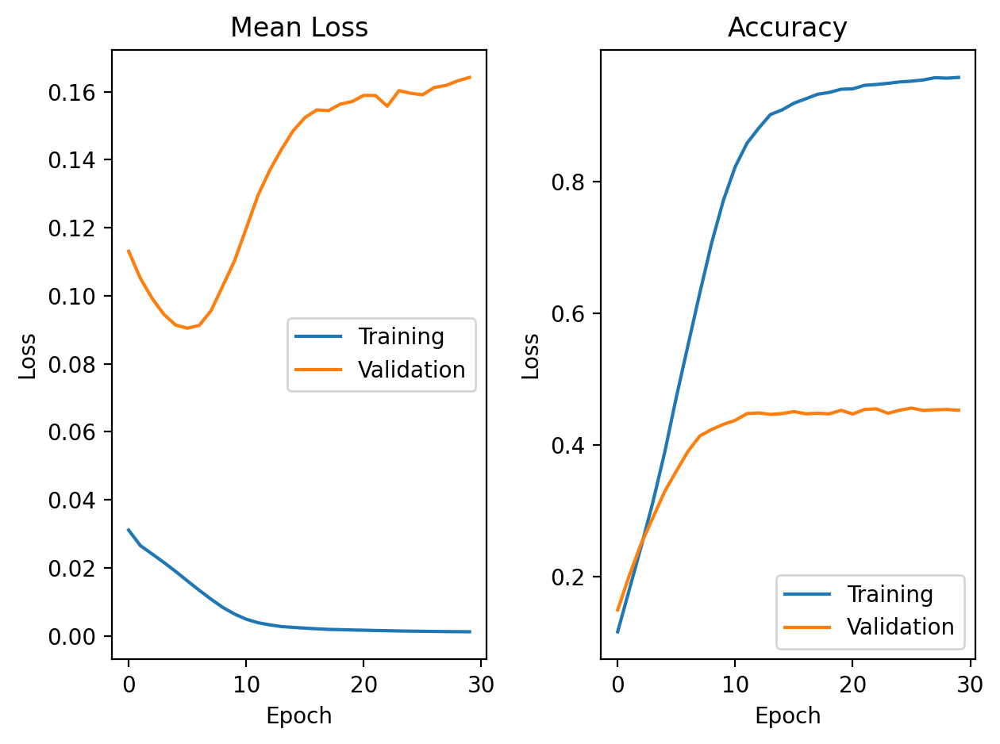

In [ ]:
# Plot the losses and accuracies
plt.subplot(1, 2, 1)
plt.plot(training_losses, label='Training')
plt.plot(validation_losses, label='Validation')
plt.title("Mean Loss")
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(training_accs, label='Training')
plt.plot(validation_accs, label='Validation')
plt.title('Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

In [ ]:
# Calculate accuracy on test set
test_acc = 0
for x_truth, y_truth in test_loader:
  x_truth, y_truth = x_truth.to(device), y_truth.to(device)
  test_batch_size = x_truth.size(0)
  (h0, h1) = model.init_hidden(test_batch_size)
  y_hat, _ = model(x_truth, (h0, h1))
  test_acc += sum(torch.eq(y_truth, y_hat.argmax(1))) / test_batch_size

mean_test_accuracy = test_acc.item() / len(test_loader)
print("Final Test Accuracy:", mean_test_accuracy)


Final Test Accuracy: 0.4465485188498426


In [ ]:
# Save the model
torch.save({
  "epoch": 30,
  "model_state_dict": model.state_dict(),
  "optimizer_state_dict": optimizer.state_dict(),
  "loss": loss}, "final_weights")

In [ ]:
# Save file name location
weights_file = "drive/MyDrive/Colab Notebooks/MATH 405/RNN/final_weights"

# Problem 4 #

Write a function that randomly chooses a sequence in the test data (which has length 10) and predicts the next $n$ elements, defaulting to 500.
Convert the predicted elements to pitches, and return them as a list of length $n$.

In [ ]:
def load_model(filename):
    """ Load a saved model to continue training or evaluate """
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

    # n_notes is the number of unique pitches
    model = RNN(n_notes, 64)
    model = model.to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.RMSprop(model.parameters(), lr=.001)

    checkpoint = torch.load(filename, map_location=torch.device('cpu'))
    model.load_state_dict(checkpoint['model_state_dict'])
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    last_epoch = checkpoint['epoch']
    loss = checkpoint['loss']
    model.eval() # Toggle evaluation mode

    return model, criterion, optimizer

In [ ]:
# Load in the saved model
model, criterion, optimizer = load_model(weights_file)

In [ ]:
def predict_next_n(n=500):

  # Choose a random sequence from the test set
  random_index = torch.randint(0, len(test_data), (1,)).item()
  random_element, _ = test_data[random_index]
  random_element = random_element.to(device)  # Move to device
  test_batch_size = 1
  new_notes = random_element

  # Make the predictions
  predictions = []
  for i in range(n):

    # Initialize the hidden states and get model output
    (h0, h1) = model.init_hidden(test_batch_size)
    output, (h0, h1) = model(new_notes.unsqueeze(0), (h0, h1))
    output = output.squeeze(0)

    # Get the index of the predicted element
    prediction_index = torch.argmax(output).item()
    predicted_note = set_of_notes_chords[prediction_index]

    # Edit list of notes to use in next prediction
    note_to_add = torch.tensor([prediction_index]).to(device)
    new_notes = torch.cat((new_notes[1:], note_to_add))

    # Store the next note
    predictions.append(predicted_note)

  return predictions

predictions = predict_next_n()
print(predictions)

['E4', 'B-3', 'C3', 'F4', 'A3', 'F3', 'G4', 'E4', 'B4', 'C5', 'G3', 'E5', 'C4', 'D5', 'B3', 'G2', 'B2', 'D3', 'C5', 'C4', 'B4', 'B3', 'A4', 'A3', 'G4', 'G3', 'F#4', 'F#3', 'G4', 'G3', 'E4', 'E3', 'G4', 'D3', 'A4', 'C4', 'A4', 'A3', 'G4', 'D3', 'C4', 'D4', 'C6', 'G3', 'D4', 'D6', 'B3', 'B5', 'D4', 'G5', 'G4', 'G#5', 'D4', 'A5', 'C4', 'A5', 'F4', 'F5', 'D4', 'B-3', 'D4', 'B-3', 'E5', 'E4', 'C4', 'B-5', 'E5', 'B-5', 'C4', 'B-5', 'A5', 'B-5', 'F5', 'E5', 'C3', 'C3', 'G5', 'E5', 'C4', 'A3', 'F5', 'F5', 'C4', 'F5.G5', 'A3', 'G5', 'A5', 'C4', 'A5', 'F4', 'F5', 'F4', 'F5', 'G4', 'E5', 'C4', 'G4', 'E4', 'G4', 'C4', 'G5', 'F4', 'D4', 'F4', 'C6', 'C5', 'E4', 'C4', 'C6', 'E4', 'C4', 'E4', 'C4', 'C6', 'E4', 'C4', 'A5', 'C4', 'G5', 'G3', 'F5', 'C4', 'E5', 'G3', 'C4', 'E5', 'B-3', 'C4', 'E5', 'B-3', 'C4', 'F5', 'A3', 'C4', 'G5', 'E3', 'C4', 'A5', 'F3', 'C4', 'G#5', 'G3', 'G5', 'C4', 'E5', 'C4', 'F5', 'G#3', 'C4', 'F5', 'G#3', 'C4', 'B3', 'C4', 'F5', 'G#3', 'F5', 'F5', 'G#3', 'F5', 'F5', 'G#3', 'F5', 

# Problem 5 #

Convert the predictions from Problem 4 into Music21 Note and Chord objects and save it as 'mozart.mid'. Embed your music file into the notebook.

In [ ]:
current_offset = 0
output_notes = []

for prediction in predictions:

  if '.' in prediction:  # If the note is a chord

    chord_pitches = prediction.split('.')
    notes = []

    for pitch in chord_pitches:  # For each pitch
      new_note = note.Note(pitch)
      new_note.storedInstrument = instrument.Piano()   # Specify Piano as the instrument type
      notes.append(new_note)

    # Create a Chord object using list of Note objects
    new_chord = chord.Chord(notes)
    new_chord.offset = current_offset
    output_notes.append(new_chord)

  else:   # If it is just a note
    new_note = note.Note(prediction)
    new_note.storedInstrument = instrument.Piano() # Specify Piano as the instrument type
    new_note.offset = current_offset
    output_notes.append(new_note)

  # Define possible increments and their probabilities
  increments = np.array([0, 0.25, 0.5])
  # probabilities = np.array(np.array([1999, 1167, 507]))
  probabilities = np.array(np.array([199, 1167, 507]))   # Sounds better when probability is lower for 0
  probabilities = probabilities / np.sum(probabilities)

  # Randomly select an increment based on probabilities
  current_offset += np.random.choice(increments, p=probabilities)

In [ ]:
# Download music file
midi_stream = stream.Stream(output_notes)
output_file = "drive/MyDrive/Colab Notebooks/MATH 405/RNN/mozart.mid"
midi_stream.write("midi", fp=output_file)

'drive/MyDrive/Colab Notebooks/MATH 405/RNN/mozart.mid'

In [1]:
!apt install fluidsynth
!cp /usr/share/sounds/sf2/FluidR3_GM.sf2 ./font.sf2
!pip install midi2audio
from midi2audio import FluidSynth
from IPython.display import Audio

In [ ]:
# Embed in notebook
# Define the correct paths for the input MIDI file and output WAV file
midi_file = "drive/MyDrive/Colab Notebooks/MATH 405/RNN/mozart.mid"  # Path to your MIDI file
wav_file = "drive/MyDrive/Colab Notebooks/MATH 405/RNN/mozart.wav"  # Path to save the WAV file

# Convert MIDI to WAV using FluidSynth
FluidSynth("font.sf2").midi_to_audio(midi_file, wav_file)

# Load and play the audio file using IPython.display.Audio
Audio(wav_file)